### 가족 앨범 AI

##### 1. 구성원별 안면 사진 등록

In [1]:
# 안면 이미지 

from PIL import Image
from glob import glob
from IPython.display import display 
import matplotlib.pyplot as plt

root  = 'data/family(proto)/'

indivisual_dir = root+'indivisual/'
indivisual_imgs = glob(indivisual_dir+'*.jpg')
member_id = ['daughter1','father','grandmother']


def get_indivisual_imgs(imgs):
    plt.figure(figsize=(20,20))

    for idx,img in enumerate(imgs):
        image = Image.open(img)
        image = image.resize((400,400))

        plt.subplot(2,len(imgs),idx+1)
        plt.imshow(image)
        plt.title(member_id[idx])
        # display(image)
        # print(member_id[idx])

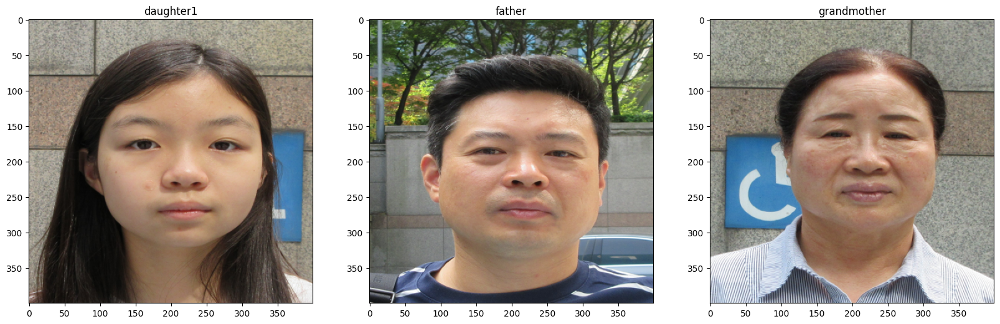

In [2]:
get_indivisual_imgs(indivisual_imgs)

In [3]:
# 안면별 벡터 추출

from face_recognition import face_recognition
import numpy as np

indivisual_imgs = glob(indivisual_dir+'*.jpg')
# print(indivisual_imgs)
member_encoding = []
member_id = ['daughter1','father','grandmother']

for indivisual_img in indivisual_imgs:
    indivisual_img = face_recognition.load_image_file(indivisual_img)
    encoding = face_recognition.face_encodings(indivisual_img)[0]
    member_encoding.append(encoding)

print(np.shape(member_encoding))

(3, 128)


In [4]:
# 안면 추출 확인

from PIL import Image, ImageDraw, ImageFont

def check_face(imgs,member_id,member_encoding):
    plt.figure(figsize=(30,30))

    for idx,img in enumerate(imgs):
        # Load an image with an unknown face
        unknown_image = face_recognition.load_image_file(img)

        # Find all the faces and face encodings in the unknown image
        face_locations = face_recognition.face_locations(unknown_image)
        face_encodings = face_recognition.face_encodings(unknown_image, face_locations)

        # Convert the image to a PIL-format image so that we can draw on top of it with the Pillow library
        # See http://pillow.readthedocs.io/ for more about PIL/Pillow
        image = Image.fromarray(unknown_image)
        # Create a Pillow ImageDraw Draw instance to draw with
        draw = ImageDraw.Draw(image)

        # Loop through each face found in the unknown image
        for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
            # See if the face is a match for the known face(s)
            matches = face_recognition.compare_faces(member_encoding, face_encoding)

            name = "Unknown"

            # Or instead, use the known face with the smallest distance to the new face
            face_distances = face_recognition.face_distance(member_encoding, face_encoding)
            best_match_index = np.argmin(face_distances)
            if matches[best_match_index]:
                name = member_id[best_match_index]

            # Draw a box around the face using the Pillow module
            draw.rectangle(((left, top), (right, bottom)), outline=(0, 0, 255))

            # Get the size of the text
            text_bbox = draw.textbbox((left, top), name, font=ImageFont.truetype("arial.ttf", 200))
            text_width = text_bbox[2] - text_bbox[0]
            text_height = text_bbox[3] - text_bbox[1]

            # Define the padding for the text box
            padding = 50

            font = ImageFont.load_default()  # 이 부분에서 사용할 폰트를 선택하거나 적절한 폰트 파일을 로드할 수 있습니다.
            font_size = 120  # 원하는 폰트 크기를 지정하세요.
            
            # Draw a label with a name above the face with the specified font and font size
            draw.rectangle(((left, top - text_height - padding, right + padding, top - padding)), fill=(0, 0, 255), outline=(0, 0, 255))
            draw.text((left + padding, top - text_height - padding), name, fill=(255, 255, 255, 255), font=ImageFont.truetype("arial.ttf", font_size))  # 폰트 크기를 지정합니다.

        # Remove the drawing library from memory as per the Pillow docs
        del draw
        image = image.resize((400,400))

        # Display the resulting image

        plt.subplot(len(imgs)//3,3,idx+1)
        plt.imshow(image)
        # display(image)


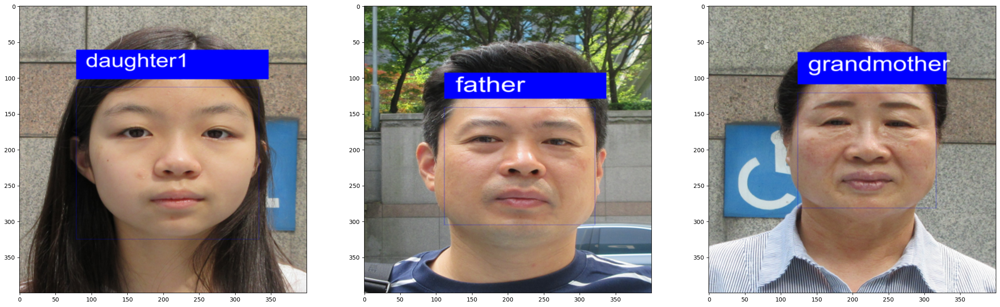

In [5]:
check_face(indivisual_imgs,member_id,member_encoding)

##### 2. 가족사진 안면 추출/분류

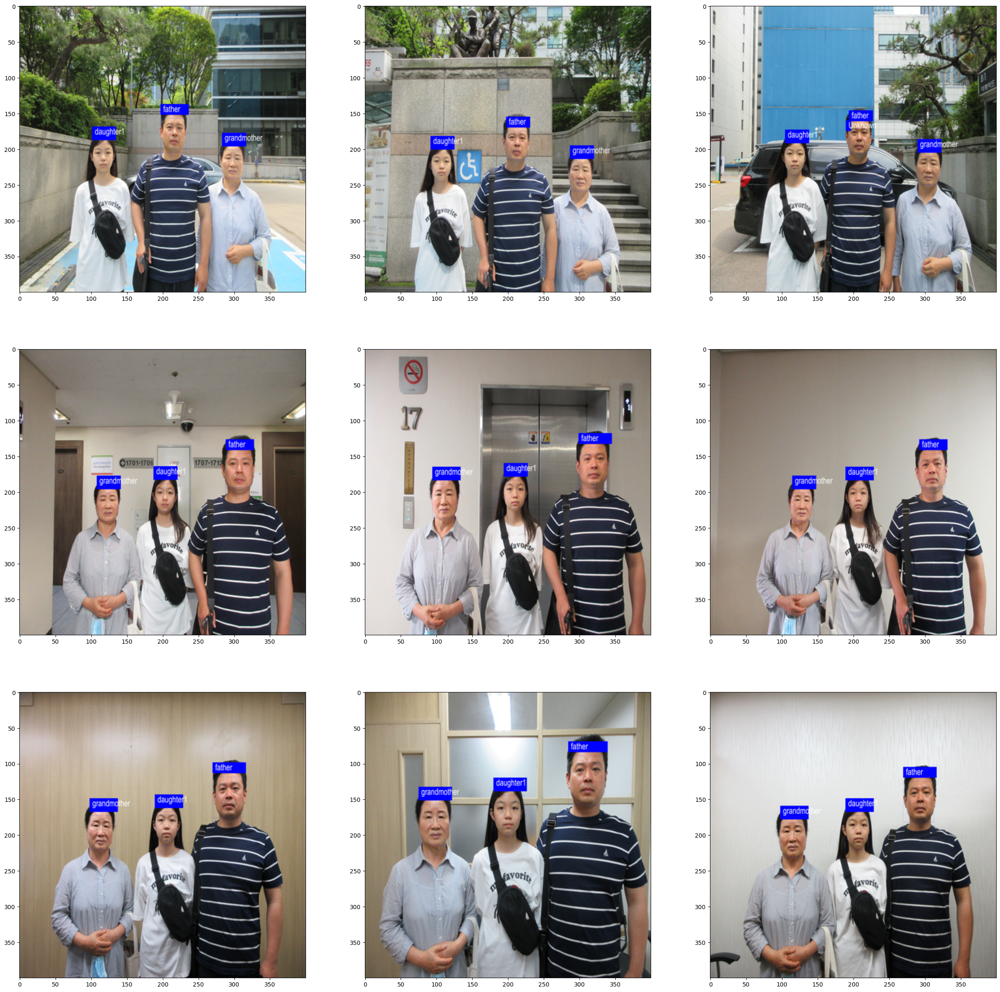

In [6]:
family_dir = root+'family/'
family_imgs = glob(family_dir+'*.jpg')

check_face(family_imgs,member_id,member_encoding)

##### 3. 가족 여행 사진 데이터 생성

In [1]:
# 배경 마스킹

from rembg.bg import remove
from PIL import Image
from glob import glob
import matplotlib.pyplot as plt

def remove_bg(imgs):
    plt.figure(figsize=(50, 50))
    for idx, img in enumerate(imgs):
        # print(img)
        input = Image.open(img)
        output = remove(input,only_mask=True)
        output = output.convert("RGB")
        output.save('data/rembg_output/'+img.split('\\')[-1].split('.')[0]+'_output.jpg')

        # 10행 2열의 서브플롯 중 왼쪽 열
        plt.subplot(len(imgs), 2, 2 * idx + 1)
        plt.imshow(input)
        plt.title("Input")

        # 10행 2열의 서브플롯 중 오른쪽 열
        plt.subplot(len(imgs), 2, 2 * idx + 2)
        plt.imshow(output)
        plt.title("Output")

    plt.subplots_adjust(wspace=-0.5, hspace=0.2)

    plt.show()

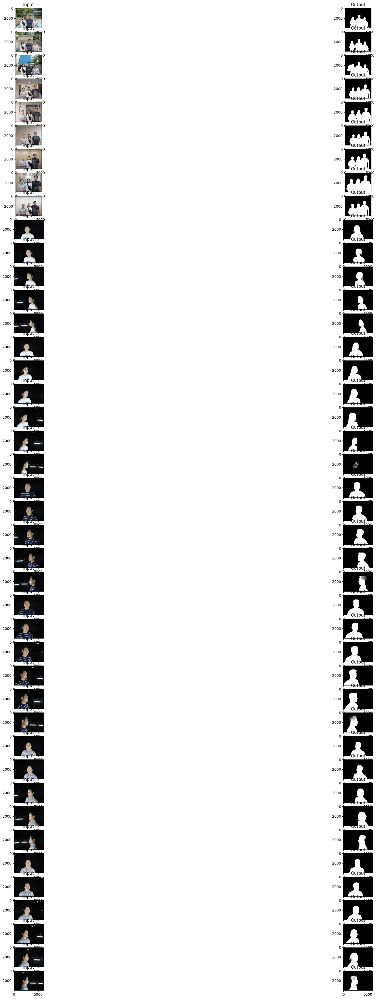

In [2]:
input_path = 'data/family(proto)/family_CAM/'
output_path = 'data/rembg_output/'

family_imgs = glob(input_path+'*.jpg')

remove_bg(family_imgs)

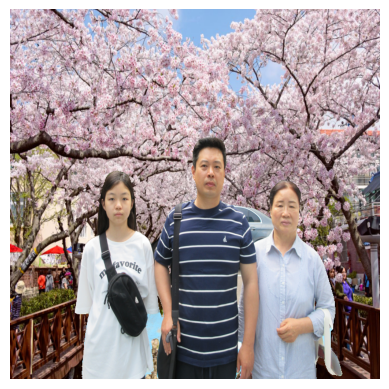

In [54]:
# 배경 합성 

from PIL import Image
import matplotlib.pyplot as plt

# 배경 이미지 (PIL Image로 읽기 및 크기 조정)
background_image = Image.open('data/travel_bg/cherry blossoms.jpg')
background_image = background_image.resize((640, 640))

# 인물 이미지 (PIL Image로 읽기 및 크기 조정)
person_image = Image.open('data/family(proto)/family_CAM/F0011_GM_F_D_71-46-13_01.JPG')

person_image = person_image.resize((640, 640))

# 인물 마스킹 이미지 (PIL Image로 읽기 및 크기 조정)
mask_image = Image.open('data/rembg_output/img1.jpg')
mask_image = mask_image.resize((640, 640))

# 마스크 이미지를 반전시켜서 배경을 검은색으로, 인물을 흰색으로 만듭니다.
mask_image = mask_image.convert("L")  # 흑백으로 변환
mask_image = mask_image.point(lambda p: p > 128 and 255)  # 0 또는 255로 수정

# 배경 이미지와 마스킹된 인물 이미지를 결합하여 새로운 이미지 생성 (PIL Image로)
result = Image.composite(person_image, background_image, mask_image)

# 결과 이미지를 Matplotlib를 사용하여 출력
plt.imshow(result)
plt.axis('off')  # 불필요한 축 표시 제거
plt.show()

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import random
from glob import glob
from tqdm import tqdm

def make_family_data(background_images,person_images,mask_images):

    plt.figure(figsize=(50,50))
    for idx, (person_image, mask_image) in tqdm(enumerate(zip(person_images,mask_images))):

        origin_name = str(person_image)
        random_bg = random.choice(background_images)
        background_image = Image.open(random_bg)
        background_image = background_image.resize((640, 640))

        person_image = Image.open(person_image)
        person_image = person_image.resize((640, 640))

        mask_image = Image.open(mask_image)
        mask_image = mask_image.resize((640, 640))

        mask_image = mask_image.convert("L")  
        mask_image = mask_image.point(lambda p: p > 128 and 255) 

        result = Image.composite(person_image, background_image, mask_image)
        result.save('data/family(travel)/'+origin_name.split('\\')[-1].split('.')[0]+'_travel.jpg')

        plt.subplot(len(person_images)//2, 2, idx + 1)
        plt.imshow(result)
        plt.axis('off')  # 불필요한 축 표시 제거
    plt.show()

0it [00:00, ?it/s]

42it [00:21,  1.95it/s]


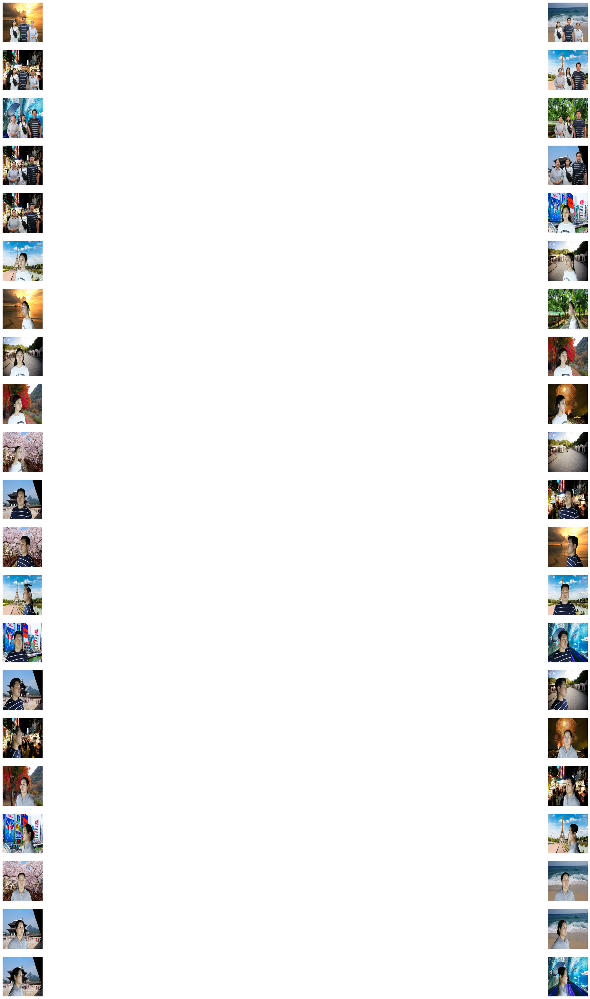

In [2]:
background_images = glob('data/travel_bg/*.jpg')
person_images = glob('data/family(proto)/family_CAM/*.jpg')
mask_images = glob('data/rembg_output/*.jpg')

make_family_data(background_images,person_images,mask_images)

##### 4. 가족 여행 사진 설명

In [7]:
# 설명 : 이미지 메타데이터(날짜/시간/위치) + 등장인물 + 배경/물체 

In [13]:
# 1) 이미지 메타데이터 추출

from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS

def extract_metadata(image_path):
    try:
        with Image.open(image_path) as img:
            # 이미지의 Exif 데이터 읽기
            exif_data = img._getexif()

            if exif_data:
                date_time = None
                gps_info = None

                for tag, value in exif_data.items():
                    tag_name = TAGS.get(tag, tag)

                    # 촬영 날짜 및 시간 추출 (DateTimeOriginal 또는 DateTime 태그 사용)
                    if tag_name == 'DateTimeOriginal' or tag_name == 'DateTime':
                        date_time = value

                    # GPS 정보 추출
                    if tag_name == 'GPSInfo':
                        gps_info = {}
                        for gps_tag, gps_value in value.items():
                            gps_tag_name = GPSTAGS.get(gps_tag, gps_tag)
                            gps_info[gps_tag_name] = gps_value

                # 촬영 날짜 및 시간 출력
                if date_time:
                    print(f"촬영 날짜 및 시간: {date_time}")

                # GPS 정보 출력
                if gps_info:
                    latitude = gps_info.get('GPSLatitude', None)
                    longitude = gps_info.get('GPSLongitude', None)
                    if latitude and longitude:
                        lat = f"{latitude[0]}° {latitude[1]}' {latitude[2]}'' {gps_info['GPSLatitudeRef']}"
                        lon = f"{longitude[0]}° {longitude[1]}' {longitude[2]}'' {gps_info['GPSLongitudeRef']}"
                        print(f"촬영 위치 (GPS): 위도 {lat}, 경도 {lon}")
                    else:
                        print("촬영 위치 (GPS) 정보 없음")
            else:
                print("이미지에 Exif 메타데이터가 없습니다.")

    except Exception as e:
        print(f"메타데이터를 추출하는 동안 오류가 발생했습니다: {e}")

family_dir = root+'family/'
family_imgs = glob(family_dir+'*.jpg')

for idx,family_img in enumerate(family_imgs):
    print(idx+1,"번째 가족사진")
    extract_metadata(family_img)
    print("\n")

1 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:34:16
촬영 위치 (GPS) 정보 없음


2 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:34:29
촬영 위치 (GPS) 정보 없음


3 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:34:43
촬영 위치 (GPS) 정보 없음


4 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:45:25
촬영 위치 (GPS) 정보 없음


5 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:45:40
촬영 위치 (GPS) 정보 없음


6 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:46:01
촬영 위치 (GPS) 정보 없음


7 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:53:22
촬영 위치 (GPS) 정보 없음


8 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:53:40
촬영 위치 (GPS) 정보 없음


9 번째 가족사진
촬영 날짜 및 시간: 2021:06:13 09:53:50
촬영 위치 (GPS) 정보 없음




In [16]:
# 2) 이미지 등장인물 추출

def extract_member(img,member_id,member_encoding):

    members = []

    unknown_image = face_recognition.load_image_file(img)
    face_locations = face_recognition.face_locations(unknown_image)
    face_encodings = face_recognition.face_encodings(unknown_image, face_locations)

    for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
        matches = face_recognition.compare_faces(member_encoding, face_encoding)

        name = "Unknown"

        face_distances = face_recognition.face_distance(member_encoding, face_encoding)
        best_match_index = np.argmin(face_distances)
        if matches[best_match_index]:
            name = member_id[best_match_index]
        members.append(name)

    print(members)

family_dir = root+'family/'
family_imgs = glob(family_dir+'*.jpg')

for idx,family_img in enumerate(family_imgs):
    print(idx+1,"번째 가족사진")
    extract_member(family_img,member_id,member_encoding)
    print("\n")

1 번째 가족사진
['grandmother', 'daughter1', 'father']


2 번째 가족사진
['grandmother', 'father', 'daughter1']


3 번째 가족사진
['father', 'daughter1', 'grandmother', 'Unknown']


4 번째 가족사진
['father', 'grandmother', 'daughter1']


5 번째 가족사진
['father', 'grandmother', 'daughter1']


6 번째 가족사진
['grandmother', 'father', 'daughter1']


7 번째 가족사진
['father', 'daughter1', 'grandmother']


8 번째 가족사진
['father', 'daughter1', 'grandmother']


9 번째 가족사진
['daughter1', 'grandmother', 'father']




In [4]:
# 3) 이미지 배경/물체 추출

from recognize_anything.ram import get_transform
from recognize_anything.ram.models import ram
from recognize_anything.ram.inference import inference_ram
import torch
import numpy as np
from PIL import Image

root = 'recognize_anything/'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device : ",device)
model = ram(pretrained=root+'pretrained/ram_swin_large_14m.pth',
                            image_size=384,
                            vit='swin_l')
model = model.to(device)
model.eval()

def tag_image(img):

    img = Image.open(img)
    print(np.shape(img))
    transform = get_transform(image_size=384)

    image = transform(img).unsqueeze(0).to(device)

    res = inference_ram(image, model)
    print("Image Tags: ", res[0])
    print("图像标签: ", res[1])
    img = img.resize((400,400))
    display(img)

c:\Users\user\miniconda3\envs\woori\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


device :  cuda
/encoder/layer/0/crossattention/self/query is tied
/encoder/layer/0/crossattention/self/key is tied
/encoder/layer/0/crossattention/self/value is tied
/encoder/layer/0/crossattention/output/dense is tied
/encoder/layer/0/crossattention/output/LayerNorm is tied
/encoder/layer/0/intermediate/dense is tied
/encoder/layer/0/output/dense is tied
/encoder/layer/0/output/LayerNorm is tied
/encoder/layer/1/crossattention/self/query is tied
/encoder/layer/1/crossattention/self/key is tied
/encoder/layer/1/crossattention/self/value is tied
/encoder/layer/1/crossattention/output/dense is tied
/encoder/layer/1/crossattention/output/LayerNorm is tied
/encoder/layer/1/intermediate/dense is tied
/encoder/layer/1/output/dense is tied
/encoder/layer/1/output/LayerNorm is tied
--------------
recognize_anything/pretrained/ram_swin_large_14m.pth
--------------
load checkpoint from recognize_anything/pretrained/ram_swin_large_14m.pth
vit: swin_l


(640, 640, 3)
Image Tags:  beach | cloudy | couple | family | family photo | person | man | sea | photo | pose | sky | stand | sunset | woman
图像标签:  海滩  | 多云 | 夫妇/两人/几个 | 家庭 | 全家福 | 人 | 男人 | 海洋  | 照片  | 摆姿势拍照 | 天空  | 站/矗立/摊位 | 日落  | 女人 


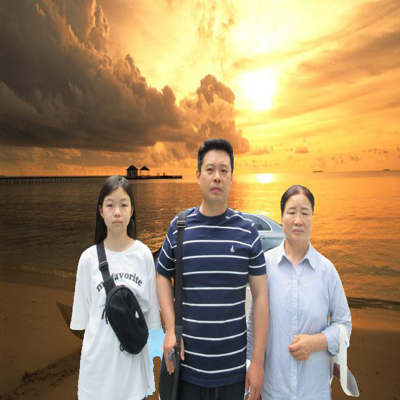

In [5]:
tag_image('data/family(travel)/F0011_GM_F_D_71-46-13_01_travel.jpg')

(640, 640, 3)
Image Tags:  beach | coast | couple | family | girl | person | man | sea | pose | stand | woman
图像标签:  海滩  | 海岸 | 夫妇/两人/几个 | 家庭 | 女孩  | 人 | 男人 | 海洋  | 摆姿势拍照 | 站/矗立/摊位 | 女人 


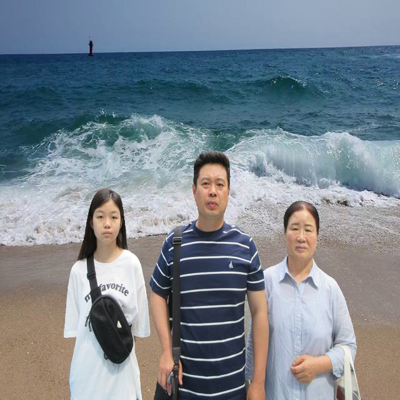

In [6]:
tag_image('data/family(travel)/F0011_GM_F_D_71-46-13_02_travel.jpg')

(640, 640, 3)
Image Tags:  Eiffel tower | family | person | man | photo | picture | pose | tower | stand | woman
图像标签:  埃菲尔铁塔 | 家庭 | 人 | 男人 | 照片  | 图片  | 摆姿势拍照 | 塔  | 站/矗立/摊位 | 女人 


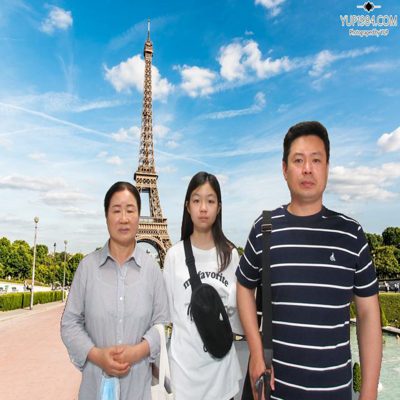

In [7]:
tag_image('data/family(travel)/F0011_GM_F_D_71-46-13_04_travel.jpg')

(640, 640, 3)
Image Tags:  aquarium | family | fish | person | man | pose | shark | stand | stingray | tank | underwater | woman
图像标签:  水族馆  | 家庭 | 鱼 | 人 | 男人 | 摆姿势拍照 | 鲨鱼  | 站/矗立/摊位 | 黄貂鱼  | 罐/蓄水池 | 水下  | 女人 


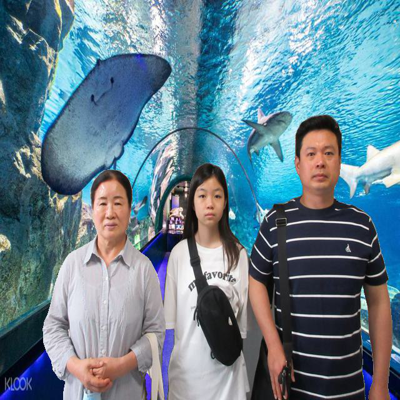

In [8]:
tag_image('data/family(travel)/F0011_GM_F_D_71-46-13_05_travel.jpg')

(640, 640, 3)
Image Tags:  family | person | man | park | pose | stand | tree | woman
图像标签:  家庭 | 人 | 男人 | 公园  | 摆姿势拍照 | 站/矗立/摊位 | 树  | 女人 


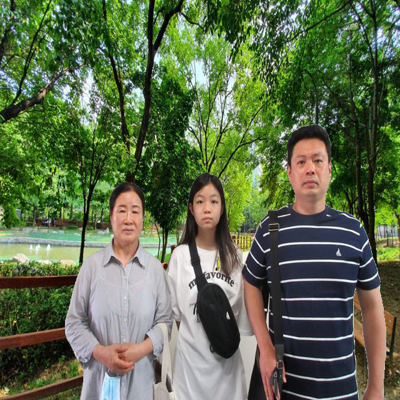

In [9]:
tag_image('data/family(travel)/F0011_GM_F_D_71-46-13_06_travel.jpg')